In [1]:
import sys 
sys.path.append("C:/Users/L2S/Desktop/Efficient_and_reliable_GP/Code/")
sys.path.append("C:/Users/L2S/Desktop/Efficient_and_reliable_GP/Code/gaussian_process_gpmp")
import gaussian_process_gpmp.num as gnp
from gaussian_process_gpmp.kernel import maternp_kernel
from dataset_generation import sampler, extract_K_samples
from dataset_visualization import check_if_plot_is_possible, plot_1D_function, plot_2D_function_3D, plot_2D_function_heatmap
from gaussian_process import mu0_initial_guess, GaussianProcess

Using backend: torch
Using backend: torch


# Parameters

In [2]:
# Dataset
function_name           = "Heaviside 2D"
space_size              = 1
N_function              = 500
all_function_parameters = {"Power sinus 1D"                : {"Power" : 1},
                           "Heaviside 1D"                  : {"x gaps" : [0, 0.5, 1], "steps value" : [1, -1], "sigma noises" : [0.2, 0.2]},
                           "Multimodal sinus 1D"           : {"x gaps" : [0, 0.5, 1], "speeds value" : [1, 2]},
                           "Noisy sinus 1D"                : {"sigma noise" : 0.2},
                           "Sinus times x 1D"              : {},
                           "Sinus cardinal 1D"             : {},
                           "Slide function"                : {},
                           "Two bumps"                     : {},
                           "Power sinus 2D"                : {"Power" : 1},
                           "Heaviside 2D"                  : {"x gaps" : [0, 1, 2], "steps value" : [1, -1], "sigma noises" : [0.2, 0.2]},
                           "Multimodal sinus 2D"           : {"x gaps" : [0, 1, 2], "speeds value" : [1, 2]},
                           "Noisy sinus 2D"                : {"sigma noise" : 0.2},
                           "Sinus times x 2D"              : {},
                           "Sinus cardinal 2D"             : {},
                           "Gaussian process trajectory"   : {"sigma0" : 1, "theta" : 1},
                           "Concrete compressive strength" : {},
                           "Energy efficiency"             : {},
                           "Auto mpg"                      : {},
                           "Combined cycle power plant"    : {},
                           "Airfoil self-noise"            : {},
                           "Morokoff & caflisch 1"         : {"Dimension" : 2},
                           "Morokoff & caflisch 2"         : {"Dimension" : 2},
                           "Branin"                        : {},
                           "Branin hoo"                    : {},
                           "Goldstein"                     : {},
                           "Goldstein price"               : {},
                           "Rosenbrock4"                   : {},
                           "Hartman4"                      : {},
                           "Hartman6"                      : {},
                           "Sphere6"                       : {},
                           "Iooss1"                        : {},
                           "Iooss2"                        : {},
                           "Wing weight"                   : {},
                           "Sobol"                         : {"a" : [1, 10]},
                           "Two input toy"                 : {},
                           "Highly non linear"             : {},
                           "Mystery"                       : {},
                           "Six hump camelback"            : {},
                           "Ishigami"                      : {}
                          }
N_train                 = 25
N_test                  = 10

# Dataset visualization
library                 = "plotly"
plot_type_2D            = "heatmap" # 3D or heatmap
save_path               = "C:/Users/L2S/Desktop/Efficient_and_reliable_GP/Results/"

# Gaussian process
p                       = 5
nugget                  = 1e-12
initialization_method   = "Custom" # GPMP, Moment-based, Custom
optimization_method     = "REML" # REML, MLE, REML - PVA, MLE - PVA, PMLE, PMLE - PVA, MSE - PVA 
custom_covparam0        = {"sigma2" : 1, "rho" : [1, 1]}
bounds                  = {"sigma2" : [1e-6, 1e5], "rho" : [[1e-6, 1e4] for _ in range(2)]} if 1 else None

# 1 - Dataset generation

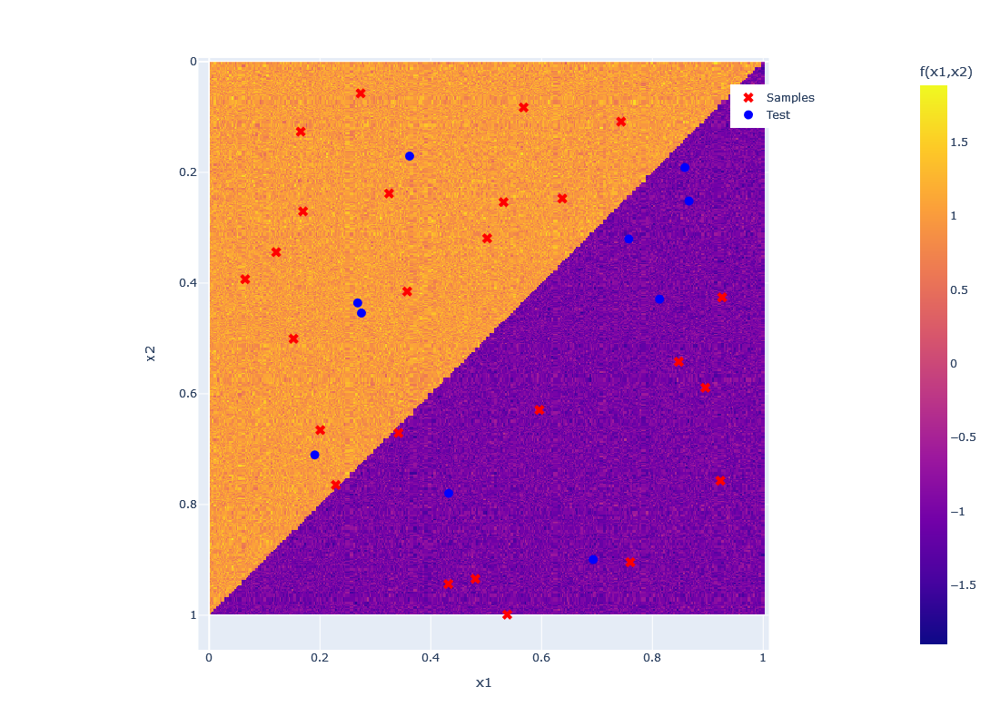

In [3]:
X_function, Y_function = sampler          (space_size, N_function, function_name, all_function_parameters)
X, Y                   = extract_K_samples(X_function, Y_function, N_train + N_test)
X_observed, Y_observed = X[:N_train], Y[:N_train]
X_test    , Y_test     = X[N_train:], Y[N_train:]
if check_if_plot_is_possible(function_name) == "1D plot":
    plot_1D_function(X_observed, Y_observed, X_test, Y_test, X_function, Y_function, library, save_path, function_name)
if check_if_plot_is_possible(function_name) == "2D plot":
    if plot_type_2D == "3D":
        plot_2D_function_3D     (X_observed, Y_observed, X_test, Y_test, X_function, function_name, all_function_parameters[function_name], library, save_path)
    if plot_type_2D == "heatmap":
        plot_2D_function_heatmap(X_observed, Y_observed, X_test, Y_test, X_function, function_name, all_function_parameters[function_name], library, save_path)

# 2 - Hyperparameters initial guess

In [4]:
mu0 = mu0_initial_guess(Y_observed)
print(mu0)

0.2126940812130992


# 3 - Gaussian process regression

In [5]:
gaussian_process   = GaussianProcess(X_observed, Y_observed, mu0, p, initialization_method, optimization_method, custom_covparam0, bounds, nugget)
gaussian_process.create_and_train_gaussian_process      ()
hyperparameters    = gaussian_process.hyperparameters   () 
covparam           = gaussian_process.covparam          ()
optimization_infos = gaussian_process.optimization_infos()
y_posterior_mean, y_posterior_variance = gaussian_process.predict(X_function)

None


In [6]:
print("Hyperparameters    : ", hyperparameters   )
print("Covparam           : ", covparam          )
print("Optimization infos : ", optimization_infos)
print("Predictions        : ", y_posterior_mean[:5], y_posterior_variance[:5], type(y_posterior_mean[:5]), type(y_posterior_variance[:5]))

Hyperparameters    :  {'Time': 1.04817533493042, 'mu0': 0.2126940812130992, 'sigma0': 1.0644387978244771, 'Noise': 1e-12, 'Length scale 0': 0.26013664237677275, 'Length scale 1': 0.29178959014919204}
Covparam           :  tensor([0.1249, 1.3465, 1.2317])
Optimization infos :  {'Hyperparameters history': [array([ 0., -0., -0.]), array([ 25924.53055573,  95611.41518828, 127660.84247021]), array([ 2592.45305557,  9561.14151883, 12766.08424702]), array([ 259.24530556,  956.11415188, 1276.6084247 ]), array([ 25.92453056,  95.61141519, 127.66084247]), array([12.97495945, 47.85252455, 63.89293147]), array([ 6.50026376, 23.97341066, 32.00941849]), array([ 3.26297992, 12.03408978, 16.0679772 ]), array([1.64440794, 6.06468725, 8.09760092]), array([0.8352323 , 3.08039298, 4.1129562 ]), array([0.43085111, 1.58900792, 2.12165137]), array([0.22907129, 0.84483035, 1.12802173]), array([  8.7848387 ,  22.70103196, -16.97109283]), array([ 4.07738618, 10.67557283, -7.01281343]), array([ 1.9691621 ,  5.28

In [7]:
gaussian_process.set_gaussian_process_hyperparameters(1, [1])
hyperparameters  = gaussian_process.hyperparameters()
print(hyperparameters)

{'Time': 1.04817533493042, 'mu0': 0.2126940812130992, 'sigma0': 1.0, 'Noise': 1e-12, 'Length scale 0': 1.0}


# 4 - Covariance matrix computation

In [8]:
covparam  = gaussian_process._gaussian_process_model.covparam
sigma2    = gnp.exp(covparam[0])
loginvrho = covparam[1:]

In [9]:
Sigma = gaussian_process.compute_covariance_matrix(X_observed, X_observed)
Sigma

tensor([[1.0000, 0.8308, 0.8809, 0.5078, 0.8404, 0.4810, 0.9906, 0.6017, 0.6990,
         0.7998, 0.5270, 0.8107, 0.7305, 0.9933, 0.4782, 0.4485, 0.7236, 0.9419,
         0.5799, 0.4090, 0.5935, 0.9382, 0.8767, 0.9289, 0.9695],
        [0.8308, 1.0000, 0.6437, 0.8400, 0.8369, 0.6299, 0.7981, 0.5796, 0.9229,
         0.9740, 0.7267, 0.7802, 0.6329, 0.8325, 0.6940, 0.7629, 0.7313, 0.6831,
         0.8989, 0.6701, 0.9054, 0.8005, 0.9759, 0.9237, 0.9245],
        [0.8809, 0.6437, 1.0000, 0.3546, 0.8652, 0.5302, 0.9341, 0.7680, 0.6096,
         0.5645, 0.5283, 0.8812, 0.9003, 0.8301, 0.4733, 0.3554, 0.8182, 0.9801,
         0.4095, 0.3709, 0.4100, 0.9579, 0.6479, 0.8508, 0.7790],
        [0.5078, 0.8400, 0.3546, 1.0000, 0.5889, 0.5790, 0.4751, 0.4001, 0.8458,
         0.8355, 0.7010, 0.5339, 0.3982, 0.5142, 0.7078, 0.9319, 0.5229, 0.3750,
         0.9909, 0.7832, 0.9826, 0.4965, 0.7668, 0.6494, 0.6327],
        [0.8404, 0.8369, 0.8652, 0.5889, 1.0000, 0.7971, 0.8733, 0.8837, 0.8816,
       

In [10]:
K = gnp.scaled_distance(loginvrho, X_observed, X_observed) 
K = sigma2 * maternp_kernel(p, K)
K = K + nugget * gnp.eye(K.shape[0])
K

tensor([[1.0000, 0.8308, 0.8809, 0.5078, 0.8404, 0.4810, 0.9906, 0.6017, 0.6990,
         0.7998, 0.5270, 0.8107, 0.7305, 0.9933, 0.4782, 0.4485, 0.7236, 0.9419,
         0.5799, 0.4090, 0.5935, 0.9382, 0.8767, 0.9289, 0.9695],
        [0.8308, 1.0000, 0.6437, 0.8400, 0.8369, 0.6299, 0.7981, 0.5796, 0.9229,
         0.9740, 0.7267, 0.7802, 0.6329, 0.8325, 0.6940, 0.7629, 0.7313, 0.6831,
         0.8989, 0.6701, 0.9054, 0.8005, 0.9759, 0.9237, 0.9245],
        [0.8809, 0.6437, 1.0000, 0.3546, 0.8652, 0.5302, 0.9341, 0.7680, 0.6096,
         0.5645, 0.5283, 0.8812, 0.9003, 0.8301, 0.4733, 0.3554, 0.8182, 0.9801,
         0.4095, 0.3709, 0.4100, 0.9579, 0.6479, 0.8508, 0.7790],
        [0.5078, 0.8400, 0.3546, 1.0000, 0.5889, 0.5790, 0.4751, 0.4001, 0.8458,
         0.8355, 0.7010, 0.5339, 0.3982, 0.5142, 0.7078, 0.9319, 0.5229, 0.3750,
         0.9909, 0.7832, 0.9826, 0.4965, 0.7668, 0.6494, 0.6327],
        [0.8404, 0.8369, 0.8652, 0.5889, 1.0000, 0.7971, 0.8733, 0.8837, 0.8816,
       

## Sigma_star = gaussian_process.compute_covariance_matrix(X_observed, X_test)
Sigma_star